In [25]:
import cv2
import os

def extract_frames(video_path, output_folder, target_fps=5):
    # Check if the video file exists
    if not os.path.exists(video_path):
        print(f"Error: Video file {video_path} does not exist.")
        return

    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video file {video_path}.")
        return

    # Get video properties
    video_fps = int(cap.get(cv2.CAP_PROP_FPS))  # Frames per second
    frame_interval = max(1, video_fps // target_fps)  # Calculate the interval to achieve target FPS
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Video FPS: {video_fps}, Total Frames: {total_frames}")

    frame_count = 0
    saved_frame_count = 0
    success, image = cap.read()

    # Loop through the video frames
    while success:
        if frame_count % frame_interval == 0:
            frame_path = os.path.join(output_folder, f"frame_{saved_frame_count}.jpg")
            cv2.imwrite(frame_path, image)
            saved_frame_count += 1
        success, image = cap.read()
        frame_count += 1

    cap.release()
    print(f"Frames extracted to: {output_folder}")
    print(f"Total frames extracted: {saved_frame_count}")

# Example usage
video_path = 'input/97kg clean and jerk.mp4'
output_folder = 'output/v1Snatch'
extract_frames(video_path, output_folder, target_fps=5)


Video FPS: 29, Total Frames: 450
Frames extracted to: output/v1Snatch
Total frames extracted: 90


In [3]:
dataset_folder_cleanJerk = 'dataset\data\Clean and Jerk'
dataset_folder_snatch = 'dataset\data\Snatch'
print(f"Clean and Jerk dataset folder is ready for use: {dataset_folder_cleanJerk}")
print(f"Snatch dataset folder is ready for use: {dataset_folder_snatch}")

Clean and Jerk dataset folder is ready for use: dataset\data\Clean and Jerk
Snatch dataset folder is ready for use: dataset\data\Snatch


<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\sdanw\AppData\Local\Temp\ipykernel_12204\2082794980.py:1: SyntaxWarning: invalid escape sequence '\d'
  dataset_folder_cleanJerk = 'dataset\data\Clean and Jerk'
C:\Users\sdanw\AppData\Local\Temp\ipykernel_12204\2082794980.py:2: SyntaxWarning: invalid escape sequence '\d'
  dataset_folder_snatch = 'dataset\data\Snatch'


In [4]:
%pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, recall_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam


In [6]:
# Define paths
dataset_path = 'dataset'

# Define ImageDataGenerator for preprocessing
datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize pixel values
    validation_split=0.2,  # Split data into training and validation
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Load data
train_data = datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

val_data = datagen.flow_from_directory(
    dataset_path,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)


Found 3212 images belonging to 2 classes.
Found 802 images belonging to 2 classes.


In [7]:
# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])


c:\Users\sdanw\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [8]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,089 (42.61 MB)

 Trainable params: 11,169,089 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
# Early stopping to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(
    train_data,
    epochs=20,
    validation_data=val_data,
    callbacks=[early_stopping]
)


c:\Users\sdanw\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 183s 2s/step - accuracy: 0.6121 - loss: 0.7772 - val_accuracy: 0.6584 - val_loss: 0.5896
Epoch 2/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.7711 - loss: 0.5054 - val_accuracy: 0.7868 - val_loss: 0.4937
Epoch 3/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.8129 - loss: 0.4173 - val_accuracy: 0.8042 - val_loss: 0.4962
Epoch 4/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.8144 - loss: 0.3953 - val_accuracy: 0.8703 - val_loss: 0.3285
Epoch 5/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.8477 - loss: 0.3174 - val_accuracy: 0.7244 - val_loss: 0.5652
Epoch 6/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.7801 - loss: 0.4493 - val_accuracy: 0.8554 - val_loss: 0.3351
Epoch 7/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.8511 - loss: 0.3351 - val_accuracy: 0.9015 - val_loss: 0.2428
Epoch 8/20
101/101 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.8618 - loss: 0.2988 - val_accu

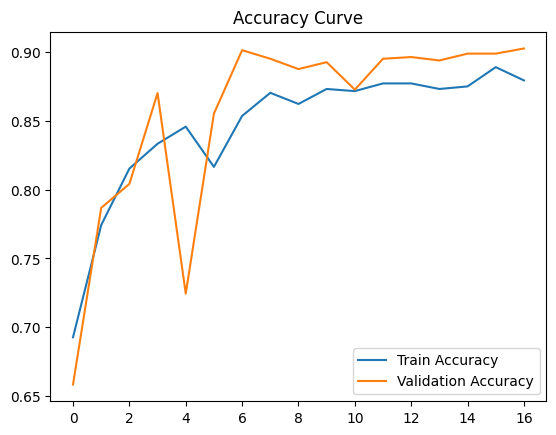

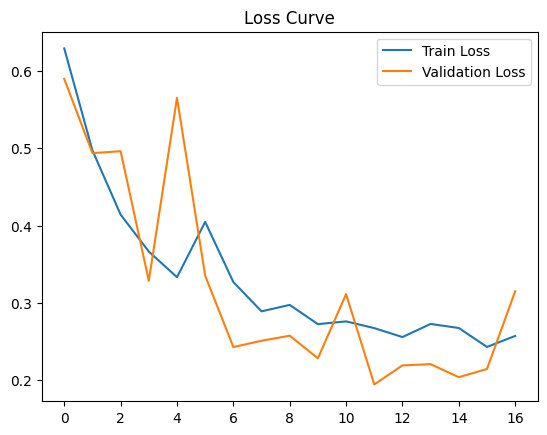

26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 616ms/step - accuracy: 0.8870 - loss: 0.2138
Validation Loss: 0.20712034404277802, Validation Accuracy: 0.8990024924278259


In [10]:
# Plot accuracy and loss curves
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')
plt.show()

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(val_data)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")


In [11]:
# Generate predictions
y_true = val_data.classes
y_pred = (model.predict(val_data) > 0.5).astype(int).flatten()

# Metrics
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))

print("Classification Report:")
print(classification_report(y_true, y_pred))

accuracy = accuracy_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print(f"Recall: {recall}")


26/26 ━━━━━━━━━━━━━━━━━━━━ 17s 629ms/step
Confusion Matrix:
[[212 177]
 [218 195]]
Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.54      0.52       389
           1       0.52      0.47      0.50       413

    accuracy                           0.51       802
   macro avg       0.51      0.51      0.51       802
weighted avg       0.51      0.51      0.51       802

Accuracy: 0.5074812967581047
F1 Score: 0.4968152866242038
Recall: 0.4721549636803874


In [12]:
# Predict on test data
y_pred_probs = model.predict(val_data)  # Get probabilities
y_pred = (y_pred_probs > 0.5).astype(int).flatten()  # Convert probabilities to binary predictions

# True labels
y_true = val_data.classes

# Class labels mapping
class_indices = val_data.class_indices
class_labels = {v: k for k, v in class_indices.items()}  # Reverse the dictionary
print("Class Labels:", class_labels)


26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 597ms/step
Class Labels: {0: 'Clean and Jerk', 1: 'Snatch'}


In [13]:
from sklearn.metrics import classification_report, confusion_matrix

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels.values()))

# Additional Metrics
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

accuracy = accuracy_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)

print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")


Confusion Matrix:
[[219 170]
 [215 198]]
Classification Report:
                precision    recall  f1-score   support

Clean and Jerk       0.50      0.56      0.53       389
        Snatch       0.54      0.48      0.51       413

      accuracy                           0.52       802
     macro avg       0.52      0.52      0.52       802
  weighted avg       0.52      0.52      0.52       802

Accuracy: 0.5199501246882793
F1 Score: 0.5070422535211268
Recall: 0.4794188861985472
Precision: 0.5380434782608695


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


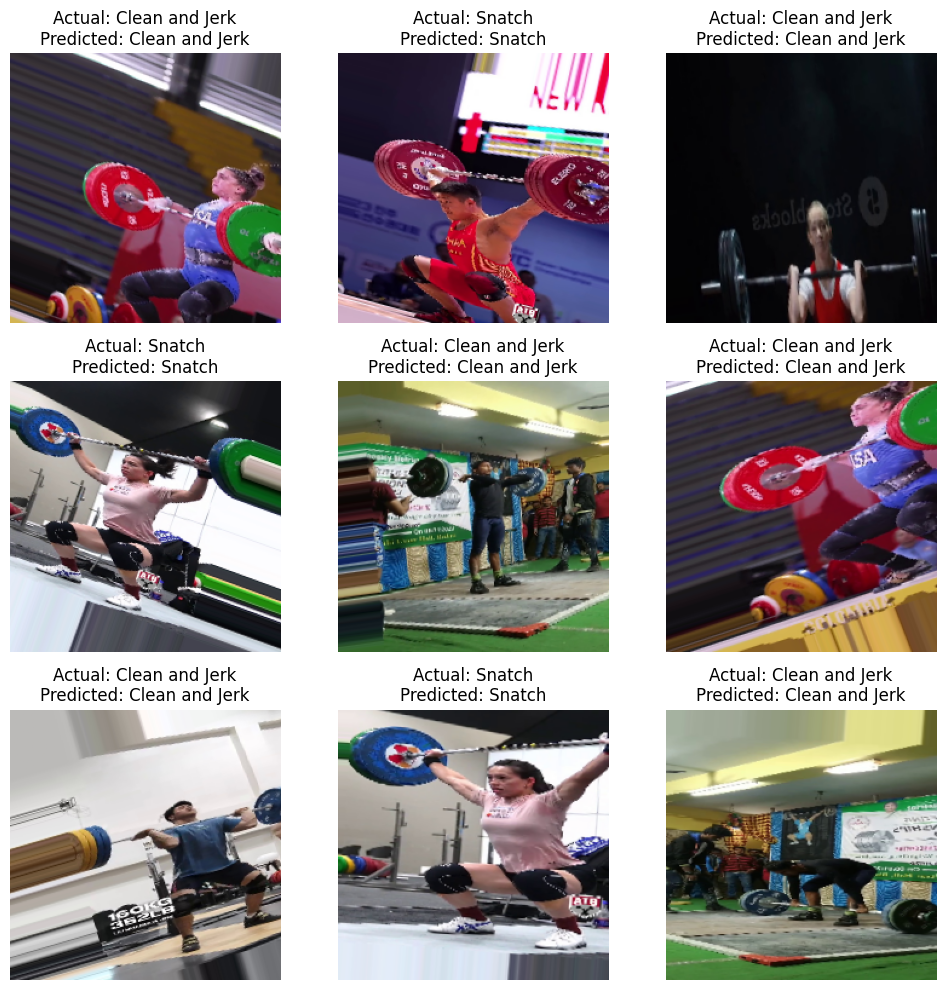

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Get a batch of test images and labels
test_images, test_labels = next(val_data)  # Use `next()` on the data generator

# Generate predictions for the batch
predicted_classes = (model.predict(test_images) > 0.5).astype(int).flatten()

# Display some test images with predictions
plt.figure(figsize=(10, 10))
for i in range(9):  # Display the first 9 images
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])  # Display the image
    actual_label = test_labels[i]  # Get the actual label
    predicted_label = predicted_classes[i]  # Get the predicted label
    plt.title(f"Actual: {class_labels[actual_label]}\nPredicted: {class_labels[predicted_label]}")
    plt.axis('off')
plt.tight_layout()
plt.show()


In [15]:
# Save the trained model
model.save("clean_and_jerk_snatch_classifier.h5")
print("Model saved successfully!")


Model saved successfully!


In [16]:
from tensorflow.keras.models import load_model

# Load the trained model
model = load_model('clean_and_jerk_snatch_classifier.h5')
print("Model loaded successfully!")


Model loaded successfully!


In [17]:
# Print the model summary
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,091 (42.61 MB)

 Trainable params: 11,169,089 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [18]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def preprocess_frame(image_path):
    # Load the image
    img = load_img(image_path, target_size=(224, 224))  # Match the input size
    img_array = img_to_array(img)  # Convert to array
    img_array = img_array / 255.0  # Normalize pixel values
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array


In [19]:
def classify_frames(output_folder, model):
    # Get all frame image paths
    frame_files = sorted([os.path.join(output_folder, f) for f in os.listdir(output_folder) if f.endswith('.jpg')])
    
    # Class labels (adjust as per your training data)
    class_labels = {0: "Clean and Jerk", 1: "Snatch"}
    
    # Dictionary to store predictions
    frame_predictions = {}
    
    for frame_path in frame_files:
        # Preprocess the frame
        frame_array = preprocess_frame(frame_path)
        
        # Predict the class
        prediction = model.predict(frame_array)
        predicted_class = (prediction > 0.5).astype(int)[0][0]  # Binary classification
        predicted_label = class_labels[predicted_class]
        
        # Save prediction
        frame_predictions[frame_path] = predicted_label
        print(f"Frame: {frame_path}, Predicted Class: {predicted_label}")
    
    return frame_predictions

# Example usage
frame_predictions = classify_frames(output_folder='output/v2Snatch', model=model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step
Frame: output/v2Snatch\frame_0.jpg, Predicted Class: Clean and Jerk
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Frame: output/v2Snatch\frame_1.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Frame: output/v2Snatch\frame_10.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Frame: output/v2Snatch\frame_100.jpg, Predicted Class: Clean and Jerk
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Frame: output/v2Snatch\frame_101.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Frame: output/v2Snatch\frame_102.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Frame: output/v2Snatch\frame_103.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Frame: output/v2Snatch\frame_104.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Frame: output/v2Snatch\frame_105.jpg, Predicted Class: Snatch
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Frame: output/v2Snatch\frame_106.jpg, Predicted Cl

In [20]:
import json

# Save predictions to a JSON file
with open('frame_predictions.json', 'w') as f:
    json.dump(frame_predictions, f)


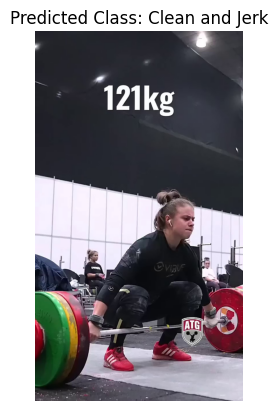

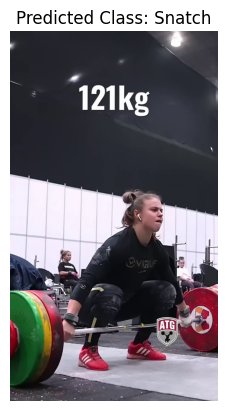

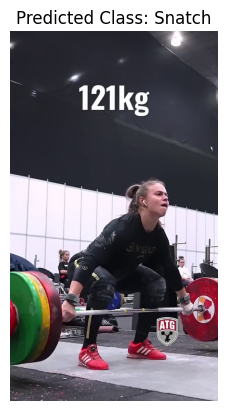

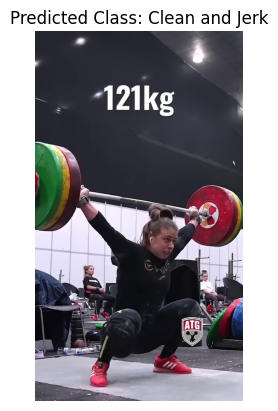

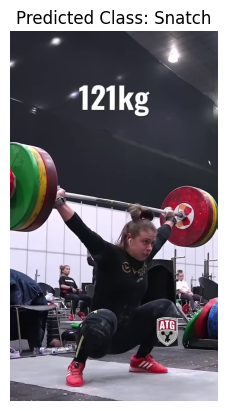

...

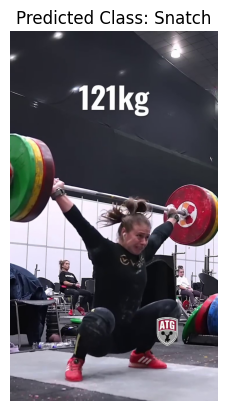

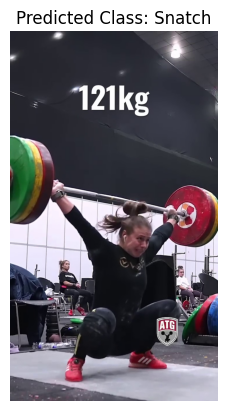

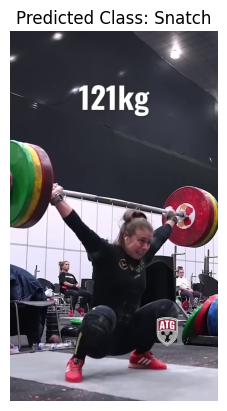

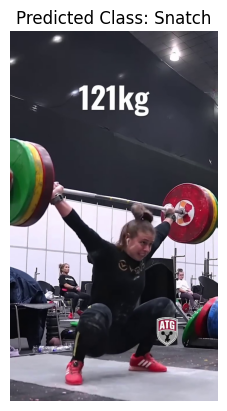

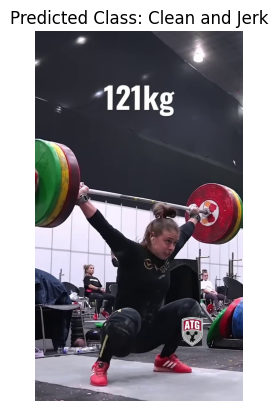

In [21]:
import matplotlib.pyplot as plt

def visualize_predictions(frame_predictions):
    for frame_path, predicted_label in frame_predictions.items():
        img = load_img(frame_path)
        plt.imshow(img)
        plt.title(f"Predicted Class: {predicted_label}")
        plt.axis('off')
        plt.show()

# Example usage
visualize_predictions(frame_predictions)


In [ ]:
from collections import Counter

def classify_video_with_percentages(frame_predictions):
    """
    Classify the video based on frame predictions and calculate the percentage of frames
    matching each class.
    
    Args:
        frame_predictions (dict): A dictionary where keys are frame paths, and values are predicted labels.
    
    Returns:
        dict: Overall prediction and percentages for each class.
    """
    # Count the frequency of predicted labels
    label_counts = Counter(frame_predictions.values())
    
    # Total number of frames
    total_frames = sum(label_counts.values())
    
    # Calculate percentages for each class
    label_percentages = {label: (count / total_frames) * 100 for label, count in label_counts.items()}
    
    # Determine the overall prediction (class with the highest percentage)
    overall_prediction = max(label_percentages, key=label_percentages.get)
    
    return {
        "overall_prediction": overall_prediction,
        "label_percentages": label_percentages
    }

# Example usage
video_result = classify_video_with_percentages(frame_predictions)
print(f"Overall Video Prediction: {video_result['overall_prediction']}")
print("Class Percentages:")
for label, percentage in video_result["label_percentages"].items():
    print(f"  {label}: {percentage:.2f}%")


Overall Video Prediction: Snatch
Class Percentages:
  Clean and Jerk: 17.97%
  Snatch: 82.03%


In [23]:
# from sklearn.model_selection import ParameterGrid

# # Define parameter grid
# param_grid = {
#     'learning_rate': [0.01, 0.001, 0.0001],
#     'batch_size': [16, 32, 64]
# }

# best_accuracy = 0
# best_params = None

# for params in ParameterGrid(param_grid):
#     # Recreate model with new learning rate
#     model = Sequential([
#         Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
#         MaxPooling2D(pool_size=(2, 2)),
#         Conv2D(64, (3, 3), activation='relu'),
#         MaxPooling2D(pool_size=(2, 2)),
#         Conv2D(128, (3, 3), activation='relu'),
#         MaxPooling2D(pool_size=(2, 2)),
#         Flatten(),
#         Dense(128, activation='relu'),
#         Dropout(0.5),
#         Dense(1, activation='sigmoid')
#     ])

#     model.compile(optimizer=Adam(learning_rate=params['learning_rate']),
#                   loss='binary_crossentropy',
#                   metrics=['accuracy'])

#     # Train model
#     history = model.fit(
#         train_data,
#         epochs=10,
#         batch_size=params['batch_size'],
#         validation_data=val_data,
#         verbose=0
#     )

#     val_accuracy = max(history.history['val_accuracy'])
#     if val_accuracy > best_accuracy:
#         best_accuracy = val_accuracy
#         best_params = params




# print(f"Best Parameters: {best_params}, Best Validation Accuracy: {best_accuracy}")
